In [1]:
cd /compute1/pranav/LION_N/


/compute1/pranav/LION_N


In [21]:
%load_ext autoreload
%autoreload 2
%matplotlib inline


The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [3]:
# Standard library imports
import os
import pickle
import importlib
import sys
sys.path.insert(1, '/compute1/pranav/LION_N')

# Third-party library imports
import clip
import matplotlib.pyplot as plt
import navis
import open3d as o3d
from PIL import Image
import plotly.graph_objs as go
import plotly.subplots as sp
import torch
import numpy as np
from torch.utils.data import DataLoader
from tqdm import tqdm
from huggingface_hub import hf_hub_download

# Local/custom imports

from default_config import cfg as config
from models.distributions import Normal
from models.lion import LION
from utils.vis_helper import plot_points

# import LION_N
# 

Jupyter environment detected. Enabling Open3D WebVisualizer.
[Open3D INFO] WebRTC GUI backend enabled.
[Open3D INFO] WebRTCWindowSystem: HTTP handshake server disabled.
Using /home/pranav/.cache/torch_extensions/py38_cu111 as PyTorch extensions root...
Detected CUDA files, patching ldflags
Emitting ninja build file /home/pranav/.cache/torch_extensions/py38_cu111/emd_ext/build.ninja...
Building extension module emd_ext...
Allowing ninja to set a default number of workers... (overridable by setting the environment variable MAX_JOBS=N)
ninja: no work to do.
Loading extension module emd_ext...
load emd_ext time: 0.189s
utils/utils.py: USE_COMET=1, USE_WB=0
Using /home/pranav/.cache/torch_extensions/py38_cu111 as PyTorch extensions root...
Detected CUDA files, patching ldflags
Emitting ninja build file /home/pranav/.cache/torch_extensions/py38_cu111/_pvcnn_backend/build.ninja...
Building extension module _pvcnn_backend...
Allowing ninja to set a default number of workers... (overridable by 

In [4]:
### Function Defintions

def initVAE(sample_points=2048):

    with open("./vae_configs.pkl",'rb') as f:
        (args,config)=pickle.load(f)    
        args.distributed = False
        args.global_size = 1

    config['shapelatent']['decoder_num_points']=sample_points
    config['data']['tr_max_sample_points']=sample_points
    config['data']['te_max_sample_points']=sample_points

    model_lib = importlib.import_module('models.vae_adain')
    model = model_lib.Model(config)
    model.to('cuda')
    return model


def getPointCloudNeuron(neuron,resample_to=2048,plot=True, standardize =True,device='cuda'):
    
    if not isinstance(neuron,navis.TreeNeuron) and  not isinstance(neuron,navis.MeshNeuron):
        neuron =  navis.read_swc(neuron)

    pc_neuron = navis.make_dotprops(neuron)
    pcd = o3d.geometry.PointCloud()
    pcd.points = o3d.utility.Vector3dVector(pc_neuron.points)
    # pp=pcd.uniform_down_sample(every_k_points=2)
    if len(pcd.points)>resample_to:
        ds_pcd=pcd.farthest_point_down_sample(resample_to)
    else:
        ds_pcd =pcd
    if plot:o3d.visualization.draw_plotly([ds_pcd])
    point_tensor =torch.Tensor(ds_pcd.points) [None,:,:]
    if standardize:
        point_tensor=(point_tensor-point_tensor.min())/(point_tensor.max()-point_tensor.min())
        point_tensor = 2 * point_tensor -1
    return point_tensor.to(device)


def vaeinfer(model,point,sty=0,tau=0):
       
    all_eps=[]
    all_log_q=[]
    latent_list=[]
    class_label =None
    cls_emb=None
    if model.args.data.cond_on_cat: 
        if class_label is not None:
            assert(class_label is not None)
            cls_emb = model.class_embedding(class_label) 
        else:
            assert(cls_emb is not None)

        enc_input = point, cls_emb 
    else:
        enc_input = point 

    z = model.style_encoder(enc_input) 
    z_mu, z_sigma = z['mu_1d'], z['sigma_1d'] # log_sigma
    dist = Normal(mu=z_mu, log_sigma=z_sigma*tau)  # (B, F)

    z_global = dist.sample()[0] 
    # all_eps.append(z_global) 
    # all_log_q.append(dist.log_p(z_global)) 
    # latent_list.append( [z_global, z_mu, z_sigma] )

    style = torch.cat([z_global, cls_emb], dim=1) if model.args.data.cond_on_cat else z_global 
    style = model.style_mlp(style) if model.style_mlp is not None else style  
    # style = torch.zeros_like(style)

    z = model.encoder([enc_input,style])
    z_mu, z_sigma = z['mu_1d'], z['sigma_1d'] # log_sigma
    z_sigma = z_sigma - model.args.shapelatent.log_sigma_offset 
    dist = Normal(mu=z_mu, log_sigma=z_sigma*tau)  # (B, F)
    z_local = dist.sample()[0] 
    # all_eps.append(z_global) 
    # all_log_q.append(dist.log_p(z_global)) 
    # latent_list.append( [z_global, z_mu, z_sigma] )

    # ---- decoder ---- #
    x_0_pred = model.decoder(None, beta=None, context=z_local, style=style) 

    return x_0_pred,z_local,z_global


def plot_multiple_point_clouds(point_clouds,titles):
    """
    Plot multiple point clouds in a single Plotly plot.

    Parameters:
    point_clouds (list of open3d.geometry.PointCloud): List of point clouds to plot.
    """
    # Initialize an empty list to store Plotly scatter traces
    traces = []
    fig = sp.make_subplots(
    rows=1, cols=len(point_clouds),
    specs=[[{'type': 'scatter3d'} for i in range(len(point_clouds))]],
    subplot_titles=tuple(titles)
    )
    # Iterate over the list of point clouds
    for i, points in enumerate(point_clouds):
        # Convert Open3D point cloud to NumPy array
        # points = pc

        # Create a Plotly scatter3d trace
        trace = go.Scatter3d(
            # title=f"cloud{i}",
            x=points[:, 0],
            y=points[:, 1],
            z=points[:, 2],
            mode='markers',
            marker=dict(size=2),
            name=f'Point Cloud {i+1}'
        )

        # Add the trace to the list
        fig.add_trace(trace, row=1, col=i+1)


    # Update layout
    fig.update_layout(
        title=f"Neuron latents in between Neuron A and Neuron B",
        scene=dict(xaxis_title='X Axis', yaxis_title='Y Axis', zaxis_title='Z Axis')
    )

    # Show the plot
    fig.show()

def overlay(y,pred,titles=("Scaled Cut Input", "Reconstructed", "Overlayed"),title=""):
    with torch.no_grad():
        points1 = y[0].cpu().detach().numpy()

        points2 = pred[0].cpu().detach().numpy()


        scatter1 = go.Scatter3d(
            x=points1[:, 0],
            y=points1[:, 1],
            z=points1[:, 2],
            mode='markers',
            marker=dict(size=1),
            name='Point Cloud 1'
        )

        scatter2 = go.Scatter3d(
            x=points2[:, 0],
            y=points2[:, 1],
            z=points2[:, 2],
            mode='markers',
            marker=dict(size=1),
            name='Point Cloud 2'
        )

        # Create subplots
        fig = sp.make_subplots(
            rows=1, cols=3,
            specs=[[{'type': 'scatter3d'}, {'type': 'scatter3d'}, {'type': 'scatter3d'}]],
            subplot_titles=titles
        )

        # Add traces to the subplots
        fig.add_trace(scatter1, row=1, col=1)
        fig.add_trace(scatter2, row=1, col=2)
        fig.add_trace(scatter1, row=1, col=3)
        fig.add_trace(scatter2, row=1, col=3)

        # Update layout
        fig.update_layout(
            title=f"{title} Loss= {((points1 - points2)**2).sum()}",
            scene=dict(xaxis_title='X Axis', yaxis_title='Y Axis', zaxis_title='Z Axis')
        )

        # Show the plot

        fig.show()  # Use browser renderer
        # time.sleep(1)  # Add a small delay between plots

In [7]:
# Dataset Initialisation
num_points =4096


from datasets.neuron_datasets import NeuronPointClouds
train_dataset= NeuronPointClouds( tr_sample_size=num_points,
                 te_sample_size=num_points,
                 split='train',
                 splits={"train":0.8,"val":0.2},
                 scale=1.,
                 standardize=True,
                 normalize_global=True,
                 recenter_per_shape=False,
                 all_points_mean=None,
                 all_points_std=None,
                 input_dim=3, 
                 sampling="random",
                 )

val_dataset= NeuronPointClouds( tr_sample_size=num_points,
                 te_sample_size=num_points,
                 split='val',
                 splits={"train":0.8,"val":0.2},
                 scale=1.,
                 standardize=True,
                 normalize_global=True,
                 recenter_per_shape=False,
                 all_points_mean=None,
                 all_points_std=None,
                 input_dim=3, 
                 sampling="random",
                 )

##############################################################################
##############################################################################
##############################################################################
##############################################################################
##############################################################################
##############################################################################
##############################################################################
##############################################################################


In [8]:
# VAE Initialisation

# vae_ckpt=torch.load("./lion_ckpt/unconditional/all55/checkpoints/vae_only.pt",map_location="cpu")
vae_ckpt=torch.load("../exp/0721/neuron/a85d8ah_hvae_lion_B32/checkpoints/best_eval.pth",map_location="cpu")
vae=initVAE(num_points)
vae.load_state_dict(vae_ckpt['model'])

2024-07-30 19:00:14.828 | INFO     | utils.model_helper:import_model:106 - import: models.shapelatent_modules.PointNetPlusEncoder
2024-07-30 19:00:14.832 | INFO     | models.shapelatent_modules:__init__:29 - [Encoder] zdim=128, out_sigma=True; force_att: 0
2024-07-30 19:00:14.832 | INFO     | utils.model_helper:import_model:106 - import: models.latent_points_ada.PointTransPVC
2024-07-30 19:00:14.833 | INFO     | models.latent_points_ada:__init__:38 - [Build Unet] extra_feature_channels=0, input_dim=3
2024-07-30 19:00:14.892 | INFO     | utils.model_helper:import_model:106 - import: models.latent_points_ada.LatentPointDecPVC
2024-07-30 19:00:14.892 | INFO     | models.latent_points_ada:__init__:241 - [Build Dec] point_dim=3, context_dim=1
2024-07-30 19:00:14.893 | INFO     | models.latent_points_ada:__init__:38 - [Build Unet] extra_feature_channels=1, input_dim=3
2024-07-30 19:00:14.952 | INFO     | models.vae_adain:__init__:50 - [Build Model] style_encoder: models.shapelatent_modules.P

<All keys matched successfully>

In [13]:
# Diffusion initialisation

# version=["0723","74fdbbh"] # from scratch 1e-6
version=["0724","f297ddh"] # from all_55 1e-6
# version=["0726","cb08deh"] # from all_55 2e-4


model_path = f'/compute1/pranav/exp/{version[0]}/neuron/{version[1]}_train_lion_B32/checkpoints/best_eval.pth'
model_config = f'/compute1/pranav/exp/{version[0]}/neuron/{version[1]}_train_lion_B32/cfg.yml'
model_path = "/compute1/pranav/exp/0727/neuron/87e07fh_train_lion_4096_B32N4096/checkpoints/best_eval.pth"
model_config = f'/compute1/pranav/exp/0727/neuron/87e07fh_train_lion_4096_B32N4096/cfg.yml'
# model_path = '/compute1/pranav/LION_N/lion_ckpt/unconditional/car//checkpoints/model.pt'
# model_config = '/compute1/pranav/LION_N/lion_ckpt/unconditional/car/cfg.yml'

config.merge_from_file(model_config)
lion = LION(config)
lion.load_model(model_path)

from utils.diffusion_pvd import DiffusionDiscretized
args=config.sde
diffusion = DiffusionDiscretized(args, None, config)

2024-07-30 19:02:06.805 | INFO     | utils.model_helper:import_model:106 - import: models.shapelatent_modules.PointNetPlusEncoder
2024-07-30 19:02:06.809 | INFO     | models.shapelatent_modules:__init__:29 - [Encoder] zdim=128, out_sigma=True; force_att: 0
2024-07-30 19:02:06.809 | INFO     | utils.model_helper:import_model:106 - import: models.latent_points_ada.PointTransPVC
2024-07-30 19:02:06.810 | INFO     | models.latent_points_ada:__init__:38 - [Build Unet] extra_feature_channels=0, input_dim=3
2024-07-30 19:02:06.869 | INFO     | utils.model_helper:import_model:106 - import: models.latent_points_ada.LatentPointDecPVC
2024-07-30 19:02:06.870 | INFO     | models.latent_points_ada:__init__:241 - [Build Dec] point_dim=3, context_dim=1
2024-07-30 19:02:06.870 | INFO     | models.latent_points_ada:__init__:38 - [Build Unet] extra_feature_channels=1, input_dim=3
2024-07-30 19:02:06.929 | INFO     | models.vae_adain:__init__:50 - [Build Model] style_encoder: models.shapelatent_modules.P

INFO finish loading from /compute1/pranav/exp/0727/neuron/87e07fh_train_lion_4096_B32N4096/checkpoints/best_eval.pth


In [16]:

def  diff_forward(val_idx,train_idx,T,B,lion=lion):
    
    inp_neuron_v = [val_dataset.__getitem__(i)['input_pts'][None,:,:].to("cuda") for i in val_idx]
    inp_neuron_t = [train_dataset.__getitem__(i)['input_pts'][None,:,:].to("cuda") for i in train_idx]
    
    inp_neuron = torch.vstack(inp_neuron_v+inp_neuron_t)

    return diff_fbatch(inp_neuron)

def diff_fbatch(inp_neuron,T=50,lion=lion):
    B =inp_neuron.shape[0]
    with torch.no_grad():
        all_eps, all_log_q, latent_list = vae.encode(inp_neuron)
        decomposed_eps = vae.decompose_eps(all_eps)
    
        rho = torch.ones(size=[B], device='cuda')*T
        timestep = rho.type(torch.int64)  

        t_p, var_t_p, m_t_p, obj_weight_t_p, _, g2_t_p = \
            diffusion.iw_quantities_t(B,timestep)


        glob=decomposed_eps[0][:,:,None,None]
        gnoise_p = torch.randn(size=glob.size(), device="cuda")
        glob_t_p = diffusion.sample_q(glob, gnoise_p, var_t_p, m_t_p)

        local=decomposed_eps[1][:,:,None,None]
        lnoise_p = torch.randn(size=local.size(), device="cuda")
        local_t_p = diffusion.sample_q(local, lnoise_p, var_t_p, m_t_p)

        pred_neuron1 = lion.sample(B,glob=glob_t_p,local=local_t_p,ts=1)['points'].detach()
        pred_neuronT = lion.sample(B,glob=glob_t_p,local=local_t_p,ts=T)['points'].detach()

    return inp_neuron,pred_neuron1,pred_neuronT
        
    
    
    
    
def diff_forward_all(T=50,lion=lion,bs=32):
    val_loader = DataLoader(val_dataset,bs)
    train_loader = DataLoader(train_dataset,bs)
    
    val_loss = 0
    for batch in tqdm(val_loader):
        inp_neuron,pred_neuron1,pred_neuronT= diff_fbatch(batch['input_pts'].to("cuda"), T=T,lion=lion)
        val_loss += ((inp_neuron-pred_neuronT)**2).sum().item()
    
    val_loss /= (len(val_loader)*bs)
    
    train_loss=0
    for batch in tqdm(train_loader):
        inp_neuron,pred_neuron1,pred_neuronT= diff_fbatch(batch['input_pts'].to("cuda"), T=T,lion=lion)
        train_loss += ((inp_neuron-pred_neuronT)**2).sum().item()
        
    train_loss /= (len(train_loader)*bs)
    
    return val_loss,train_loss
    
    
def recon_loss(num_samples=32,T=50):
    
    val_idx = np.array([ 790, 3944, 1414,  486, 2720, 2611, 2041, 3463, 4195, 1118, 4225,
        101,  695, 4190, 2424, 4833, 2166, 2079, 2374, 3674, 3693, 1029,
       1865, 4117, 3837,  501, 4152, 3922, 4335, 4007,  347, 1240])
    train_idx = np.array([16411,  9394, 11138,  2539,  5956, 15502, 18157, 14098, 18529,
        1935,  9488, 10902, 13901,  9711,   809,  7335,  5666,  4586,
        9251,  5135, 19169, 14784,  6010,  8344,  1464, 10128,  7526,
       12134, 11736, 14079, 14665,  1452])
    
#     np.random.seed(324)
#     val_idx = np.random.choice(len(val_dataset),num_samples)
#     train_idx = np.random.choice(len(train_dataset),num_samples)
    # /compute1/pranav/exp/0727/neuron/
#     ebe45dh_train_lion_B32
    ckpt_path ="/compute1/pranav/exp/0727/neuron/87e07fh_train_lion_4096_B32N4096/checkpoints"
    paths=[(int(eval_path.split('_')[1]),(ckpt_path+"/"+eval_path))  for eval_path in os.listdir(ckpt_path) if eval_path.endswith('pt')]
    paths.sort(key=lambda x:x[0])
    # paths.insert(0,("zero","/compute1/pranav/LION_N/lion_ckpt/unconditional/all55/checkpoints/epoch_10999_iters_2100999.pt"))
    paths.append(("best",ckpt_path+"/best_eval.pth"))
    results=[]
    for epoch_num,eval_path in paths:
        lion.load_model(eval_path)
        inp_neuron,pred_neuron1,pred_neuronT = diff_forward(val_idx,train_idx,T,num_samples*2,lion)
        results.append((epoch_num,inp_neuron,pred_neuron1,pred_neuronT))
    
    return results
    
    

In [29]:
results = recon_loss(T=200)

INFO finish loading from /compute1/pranav/exp/0727/neuron/87e07fh_train_lion_4096_B32N4096/checkpoints/epoch_3_iters_2587.pt
INFO finish loading from /compute1/pranav/exp/0727/neuron/87e07fh_train_lion_4096_B32N4096/checkpoints/epoch_7_iters_5175.pt
INFO finish loading from /compute1/pranav/exp/0727/neuron/87e07fh_train_lion_4096_B32N4096/checkpoints/epoch_11_iters_7763.pt
INFO finish loading from /compute1/pranav/exp/0727/neuron/87e07fh_train_lion_4096_B32N4096/checkpoints/epoch_15_iters_10351.pt
INFO finish loading from /compute1/pranav/exp/0727/neuron/87e07fh_train_lion_4096_B32N4096/checkpoints/epoch_19_iters_12939.pt
INFO finish loading from /compute1/pranav/exp/0727/neuron/87e07fh_train_lion_4096_B32N4096/checkpoints/best_eval.pth


In [30]:
epochs = []
train_losses =[]
val_losses=[]
for epoch, input, denoise1, denoiseT in results[:-1]:
    val_inp,train_inp  = torch.split(input,32)
    val_dn1,train_dn1 =torch.split(denoise1,32)
    val_dnT,train_dnT =torch.split(denoiseT,32)
    
    train_loss = ((train_inp-train_dnT)**2).sum((1,2)).mean().item()
    val_loss = ((val_inp-val_dnT)**2).sum((1,2)).mean().item()
    
    epochs.append(epoch)
    train_losses.append(train_loss)
    val_losses.append(val_loss)
    
    

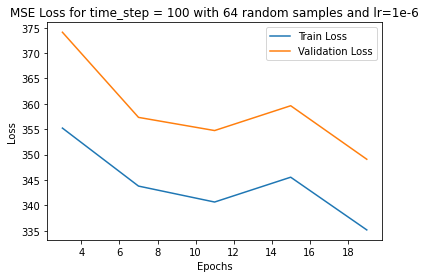

In [31]:
plt.plot(epochs, train_losses, label='Train Loss')
plt.plot(epochs, val_losses, label='Validation Loss')
plt.legend()
plt.xlabel('Epochs')
plt.ylabel('Loss')
# plt.xticks(np.arange(len(epochs))[::2], epochs[::2])
_=plt.title(f'MSE Loss for time_step = {100} with 64 random samples and lr=1e-6')



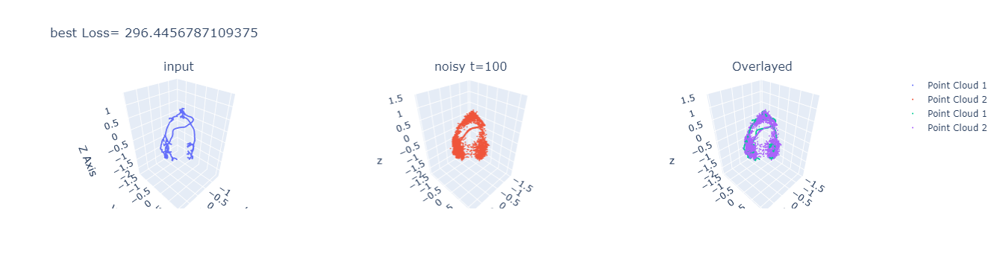

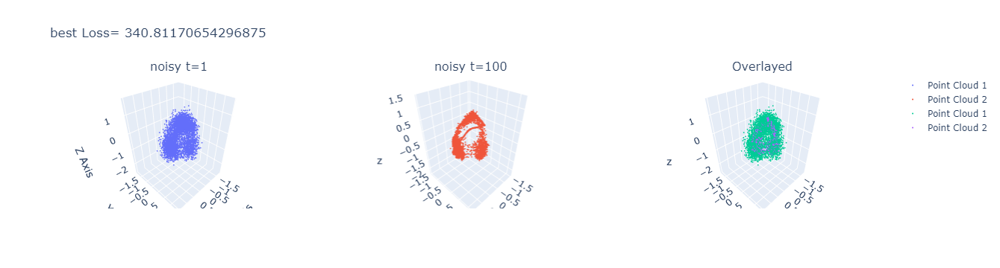

In [32]:
title,inp_neuron, denoise1,denoiseT = results[5]
overlay(inp_neuron,denoiseT,("input", f"noisy t={100}", "Overlayed"),title)
overlay(denoise1,denoiseT,("noisy t=1", f"noisy t={100}", "Overlayed"),title)

In [29]:
inp_neuron.shape

torch.Size([64, 2048, 3])

In [ ]:
# FULL DATASET ALL CHECKPOINTS 
#18m per val set

ckpt_path ="/compute1/pranav/exp/0726/neuron/ebe45dh_train_lion_B32/checkpoints"
paths=[(int(eval_path.split('_')[1]),(ckpt_path+"/"+eval_path))  for eval_path in os.listdir(ckpt_path) if eval_path.endswith('pt')]
paths.sort(key=lambda x:x[0])
paths.insert(0,("zero","/compute1/pranav/LION_N/lion_ckpt/unconditional/all55/checkpoints/epoch_10999_iters_2100999.pt"))
paths.append(("best",ckpt_path+"/best_eval.pth"))


epochs = []
train_losses =[]
val_losses=[]

for epoch_num,eval_path in paths:
    lion.load_model(eval_path)
    v_loss,t_loss = diff_forward_all(T,lion,bs=64)
    epochs.append(epoch_num)
    train_losses.append(t_loss)
    val_losses.append(v_loss)
    
plt.plot(epochs, train_losses, label='Train Loss')
plt.plot(epochs, val_losses, label='Validation Loss')
plt.legend()
plt.xlabel('Epochs')
plt.ylabel('Loss')
_=plt.title(f'Training and Validation Loss for T = {T}')



In [48]:
inp_neuron = torch.vstack([val_dataset.__getitem__(i)['input_pts'][None,:,:].to("cuda") for i in [21,34]])
all_eps, all_log_q, latent_list = vae.encode(inp_neuron)
decomposed_eps = vae.decompose_eps(all_eps)
rho = torch.ones(size=[2], device='cuda')*50
timestep = rho.type(torch.int64)  

t_p, var_t_p, m_t_p, obj_weight_t_p, _, g2_t_p = \
    diffusion.iw_quantities_t(2,timestep)

glob=decomposed_eps[0][:,:,None,None]
gnoise_p = torch.randn(size=glob.size(), device="cuda")*0
glob_t_p = diffusion.sample_q(glob, gnoise_p, var_t_p, m_t_p)

local=decomposed_eps[1][:,:,None,None]
lnoise_p = torch.randn(size=local.size(), device="cuda")
local_t_p = diffusion.sample_q(local, lnoise_p, var_t_p, m_t_p)


output = lion.sample(2,glob=glob_t_p,local=local_t_p,ts=1)
pred_neuron1 = output['points'].detach()

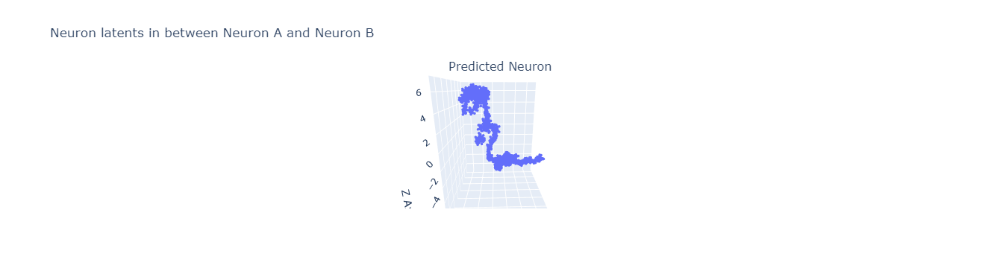

In [52]:
plot_multiple_point_clouds(pred_neuron1[1:].cpu().numpy(),["Predicted Neuron"])

In [37]:
# get VAE latents from neuron

inp_neuron = val_dataset.__getitem__(4682)['input_pts'][None,:,:].to("cuda")
# inp_neuron *= torch.rand_like(inp_neuron)
recon_neuron, local_latent, global_latent =vaeinfer(vae,inp_neuron,tau=1)
local_latent=local_latent[...,None,None]
global_latent=global_latent[...,None,None]
local_latent.shape,global_latent.shape



(torch.Size([1, 8192, 1, 1]), torch.Size([1, 128, 1, 1]))

In [27]:
import numpy as np
np.random.choice(len(train_dataset),10)

array([16413, 16792,   567,  8468,   359,  9479, 16852, 16738, 13391,
       19301])

In [10]:
with torch.no_grad():
    all_eps, all_log_q, latent_list = vae.encode(inp_neuron)
    decomposed_eps = vae.decompose_eps(all_eps)

In [18]:
rho = torch.ones(size=[1], device='cuda')*50 #* self._diffusion_steps
timestep = rho.type(torch.int64)  

t_p, var_t_p, m_t_p, obj_weight_t_p, _, g2_t_p = \
    diffusion.iw_quantities_t(1,timestep)



glob=decomposed_eps[0][:,:,None,None]
gnoise_p = torch.randn(size=glob.size(), device="cuda")*0
glob_t_p = diffusion.sample_q(glob, gnoise_p, var_t_p, m_t_p)

local=decomposed_eps[1][:,:,None,None]
lnoise_p = torch.randn(size=local.size(), device="cuda")
local_t_p = diffusion.sample_q(local, lnoise_p, var_t_p, m_t_p)


# style = vae.style_mlp(glob_t_p) #if model.style_mlp is not None else style  

# x_0_pred = vae.decoder(None, beta=None, context=local_t_p[0], style=glob_t_p[0]) 


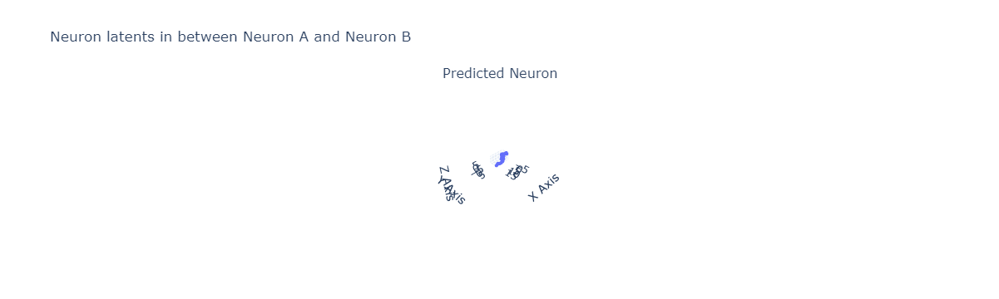

In [23]:
# sample 

output = lion.sample(1,glob=glob_t_p,local=local_t_p,ts=1)
pred_neuron1 = output['points'].detach()

output = lion.sample(1,glob=glob_t_p,local=local_t_p,ts=1000)
pred_neuron10 = output['points'].detach()
plot_multiple_point_clouds(pred_neuron1.cpu().numpy(),["Predicted Neuron"])

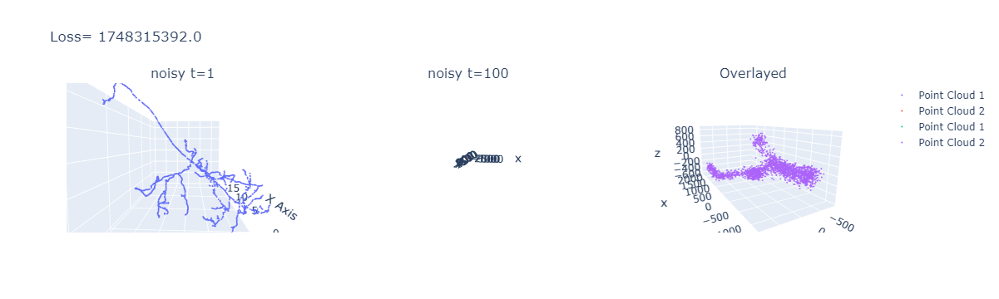

In [24]:
overlay(inp_neuron,pred_neuron10,("noisy t=1", "noisy t=100", "Overlayed"))
# overlay(pred_neuron1,pred_neuron10,("noisy t=1", "noisy t=100", "Overlayed"))

In [54]:
ckpt_path ="/compute1/pranav/exp/0726/neuron/ebe45dh_train_lion_B32/checkpoints"
paths=[(int(eval_path.split('_')[1]),(ckpt_path+"/"+eval_path))  for eval_path in os.listdir(ckpt_path) if eval_path.endswith('pt')]
paths.sort(key=lambda x:x[0])
paths.insert(0,("zero","/compute1/pranav/LION_N/lion_ckpt/unconditional/all55/checkpoints/epoch_10999_iters_2100999.pt"))
paths.append(("best",ckpt_path+"/best_eval.pth"))

In [65]:

ckpt_path ="/compute1/pranav/exp/0726/neuron/ebe45dh_train_lion_B32/checkpoints"
results=[]
T=50
paths=[(int(eval_path.split('_')[1]),(ckpt_path+"/"+eval_path)  for eval_path in os.listdir(ckpt_path) if eval_path.endswith('pt')]
paths.sort(key=lambda x:x[0])



epoch_num ="zero"
lion.load_model("/compute1/pranav/LION_N/lion_ckpt/unconditional/all55/checkpoints/epoch_10999_iters_2100999.pt")
step1  = lion.sample(1,glob=glob_t_p,local=local_t_p,ts=1 )['points'].detach()
stepT = lion.sample(1,glob=glob_t_p,local=local_t_p,ts=T)['points'].detach()
results.append((epoch_num,step1,stepT))



for epoch_num,eval_path in paths:
    lion.load_model(ckpt_path+"/"+eval_path)
    step1  = lion.sample(1,glob=glob_t_p,local=local_t_p,ts=1 )['points'].detach()
    stepT = lion.sample(1,glob=glob_t_p,local=local_t_p,ts=T)['points'].detach()
    results.append((epoch_num,step1,stepT))
    


eval_path ="best_eval.pth"
epoch_num ="best"
lion.load_model(ckpt_path+"/"+eval_path)
step1  = lion.sample(1,glob=glob_t_p,local=local_t_p,ts=1 )['points'].detach()
stepT = lion.sample(1,glob=glob_t_p,local=local_t_p,ts=T)['points'].detach()
results.append((epoch_num,step1,stepT))


INFO finish loading from /compute1/pranav/LION_N/lion_ckpt/unconditional/all55/checkpoints/epoch_10999_iters_2100999.pt
INFO finish loading from /compute1/pranav/exp/0726/neuron/ebe45dh_train_lion_B32/checkpoints/epoch_1_iters_1293.pt
INFO finish loading from /compute1/pranav/exp/0726/neuron/ebe45dh_train_lion_B32/checkpoints/epoch_3_iters_2587.pt
INFO finish loading from /compute1/pranav/exp/0726/neuron/ebe45dh_train_lion_B32/checkpoints/epoch_5_iters_3881.pt
INFO finish loading from /compute1/pranav/exp/0726/neuron/ebe45dh_train_lion_B32/checkpoints/epoch_7_iters_5175.pt
INFO finish loading from /compute1/pranav/exp/0726/neuron/ebe45dh_train_lion_B32/checkpoints/epoch_9_iters_6469.pt
INFO finish loading from /compute1/pranav/exp/0726/neuron/ebe45dh_train_lion_B32/checkpoints/epoch_11_iters_7763.pt
INFO finish loading from /compute1/pranav/exp/0726/neuron/ebe45dh_train_lion_B32/checkpoints/epoch_13_iters_9057.pt
INFO finish loading from /compute1/pranav/exp/0726/neuron/ebe45dh_train_l

zero 406.463623046875
1 453.0488586425781
3 446.2089538574219
5 419.7396545410156
7 429.1593017578125
9 425.0494384765625
11 430.0147705078125
13 430.43524169921875
15 423.1009521484375
17 443.5711669921875
19 402.0413818359375
21 424.5068359375
23 421.72943115234375
25 413.98529052734375
27 449.61773681640625
29 428.92742919921875
31 424.6336669921875
33 426.67681884765625
35 427.6863708496094
37 426.323486328125
39 412.15130615234375
41 426.4608154296875
best 427.75579833984375


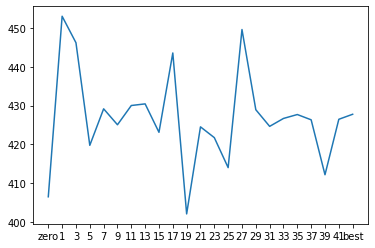

In [66]:
y=[]
x=[]
for title, denoise1,denoiseT in results:
    x.append(title)
    y.append(((inp_neuron-denoiseT)**2).sum().item())
    print(title,((inp_neuron-denoiseT)**2).sum().item())
    
plt.plot(x,y)


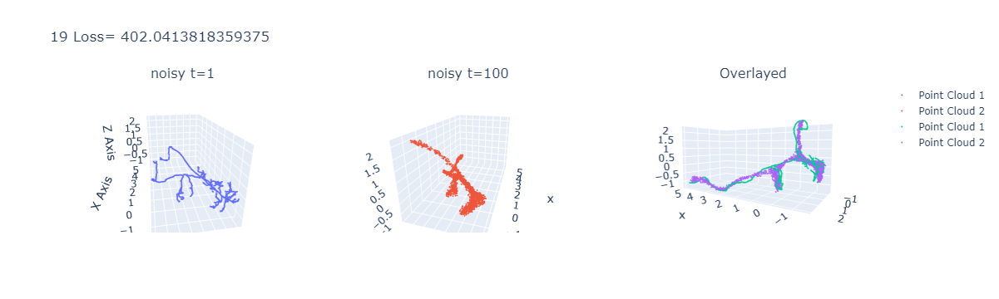

In [73]:
title, denoise1,denoiseT = results[10]
overlay(inp_neuron,denoiseT,("noisy t=1", f"noisy t={T}", "Overlayed"),title)

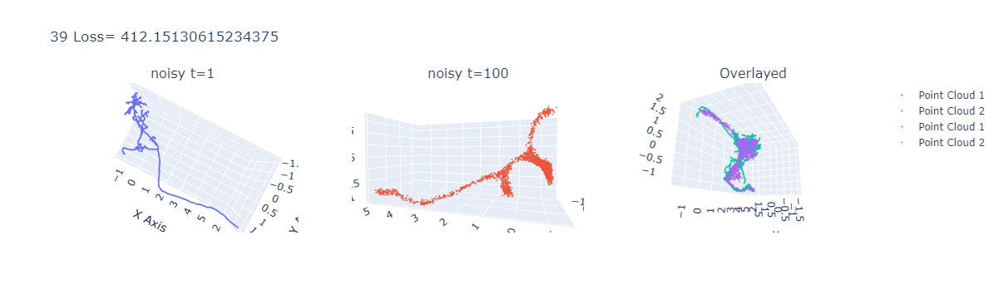

In [69]:
title, denoise1,denoiseT = results[20]
overlay(inp_neuron,denoiseT,("noisy t=1", f"noisy t={T}", "Overlayed"),title)

In [74]:
2048*2

4096

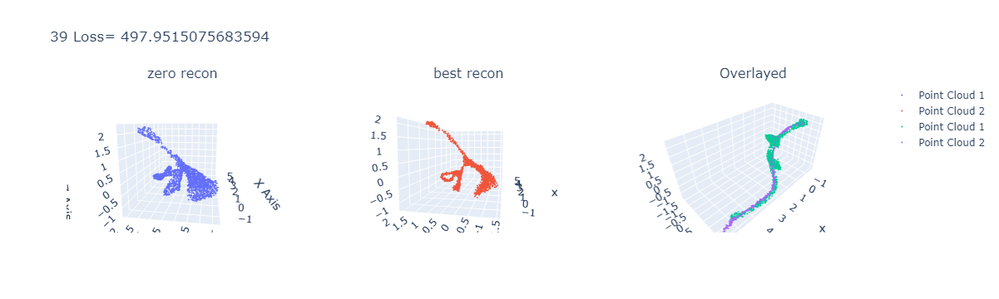

In [70]:
overlay(results[0][2],results[17][2],("zero recon", f"best recon", "Overlayed"),title)

In [ ]:

for title, denoise1,denoiseT in results:
    overlay(denoise1,denoiseT,("noisy t=1", f"noisy t={T}", "Overlayed"),title)

In [ ]:
T=50

In [ ]:
def initDAE():
    
    with open("./dae_configs.pkl",'rb') as f:
        (args,config)=pickle.load(f)    
        args.distributed = False
        args.global_size = 1

    
    DAE = nn.ModuleList(
    [
        import_model(self.cfg.latent_pts.style_prior)(args,
                                                      self.cfg.latent_pts.style_dim, self.cfg),  # global latent prior
        import_model(self.cfg.sde.prior_model)(args,
                                               num_input_channels, self.cfg),  # latent point prior, conditional model
    ])
    
    
    

In [ ]:
ls ../exp/0718/neuron/

In [ ]:
# train_example = train_dataset.__getitem__(2578)['input_pts'].numpy()
# plot_multiple_point_clouds([train_example],["w"])

In [ ]:

pt_trch =val_dataset.__getitem__(1842)['input_pts'][None,:,:].to("cuda")
na_pred, za, stya =vaeinfer(vae,pt_trch)
# na_pred_npy = na_pred.detach().cpu().numpy()
# plot_multiple_point_clouds([train_example,na_pred[0]],["k","w"])

In [ ]:
overlay(pt_trch,na_pred,("Scaled Input", "Reconstructed", "Overlayed"))

In [ ]:
mesh = navis.read_mesh('../295779961.obj')
mesh_points = navis.make_dotprops(mesh)

In [ ]:
point_cloud_neuron =o3d.geometry.PointCloud(  o3d.utility.Vector3dVector(mesh_points.points))

In [ ]:
o3d.visualization.draw([point_cloud_neuron])

In [ ]:
with torch.no_grad():
    mesht=torch.from_numpy(mesh_points.points)
    mesht=(mesht - mesht.mean(0))/mesht.std(0)
    mesht=mesht[None,:,:].to("cuda").float()
    na_pred, za, stya =vaeinfer(vae,mesht)
    print(((mesht-na_pred)**2).sum())

In [ ]:
import numpy as np
idx = np.random.choice(584242,50000,replace=False)

In [ ]:
pt1 =mesht.cpu()[:,idx]
pt2 = na_pred.cpu()[:,idx]

In [ ]:
overlay(pt1,pt2,("Scaled Input", "Reconstructed", "Overlayed"))

In [ ]:
val_loader = DataLoader(dataset=val_dataset,
                                   batch_size=32,
                                   num_workers=2,
                                   drop_last=True,
                                   pin_memory=False)

loss=[]
with torch.no_grad():
    for y in tqdm(val_loader):
        pred, za, stya =vaeinfer(vae,y['input_pts'].cuda())
        loss.append( ((y['input_pts']-pred.cpu())**2).sum((1,2)))
vlossb4=torch.hstack(loss)

In [ ]:
vlosst4.sum(),vlosst4.mean(),vlossb4.sum(),vlossb4.mean()

In [ ]:
vlosst.sum(),vlosst.mean(),vlossb.sum(),vlossb.mean()

In [ ]:
losst.sum(),losst.mean(),lossb.sum(),lossb.mean()

In [ ]:
# loss pure best_eval 7/21
plt.hist(lossb.numpy(),100,[0,10])

In [ ]:
# loss pure vae_all
# vae_all 11000

plt.hist(losst.numpy(),100,[0,30])

In [ ]:
lookup={swc:idx for idx,swc in enumerate(train_dataset.swc_list)}
ref =295779961
lookup[f"{ref}.npy"]

In [ ]:
vae.get_loss(pt_trch,it=1)['loss']

In [ ]:
example_airplane=torch.load("datasets/ref_val_car.pt")
ex_pts=example_airplane['ref'].to('cuda')

point = ex_pts[0:1]

In [ ]:
ex_pts.shape